# Grid Search for the best Models

In [8]:
# Utilties
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

In [2]:
# Rehusable functions

def grid_report(grid, X_test, y_true, name='Model'):

    y_pred = grid.best_estimator_.predict(X_test)
    r2 = r2_score(y_true, y_pred)

    print('='*60)
    print(f'------ {name} ------ \n')
    print('Best Score : {:0.4f}'.format(grid.best_score_))
    print(f'Best parameters: {grid.best_params_}')
    print('-'*60)
    print('Test')
    print('R2: {:0.4f}'.format(r2))

    plt.plot([y_true.min(), y_true.max()],
              [y_true.min(), y_true.max()],
              'k--', linewidth=2, c='salmon')

    plt.scatter(y_true, y_pred, c='skyblue',
                label='R2: {:0.4f}'.format(r2))
    plt.legend()
    plt.title(f'Permorfamce model: {name}', fontsize=15)
    plt.ylabel('Predicted [$W/m^2$]')
    plt.xlabel('True data [$W/m^2$]')

def performance_plot(y_true, y_pred, name, r2):

    plt.plot([y_true.min(), y_true.max()],
              [y_true.min(), y_true.max()],
              'k--', linewidth=2, c='salmon')

    plt.scatter(y_true, y_pred, c='skyblue',
                label='R2: {:0.4f}'.format(r2))
    plt.legend()
    plt.title(f'Permorfamce model: {name}', fontsize=12)
    plt.ylabel('Predicted [$W/m^2$]')
    plt.xlabel('True data [$W/m^2$]')
    plt.show()
    
def report_model(model, X_test, y_test, name):
    y_pred = model.predict(X_test)
    r2 = model.score(X_test, y_test)
    
    performance_plot(y_test, y_pred, name, r2) 

In [3]:
# Create sets
df = pd.read_csv('../../data/ghi.csv')

X = df.drop('GHI', axis=1)
y = df['GHI'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

### Random Forest Regressor

According to Probst (2019) The best for to tune RFR is tune the parameters mtry, sample size and node size simultanously.

------ RandomForestRegressor ------ 

Best Score: 0.9168
Best parameters: {'min_samples_split': 500, 'n_estimators': 300}
------------------------------------------------------------
Test
R2: 0.9176


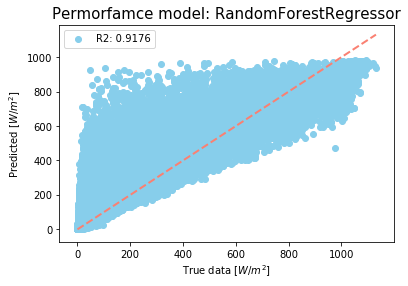

In [7]:
# Model
from sklearn.ensemble import RandomForestRegressor

# Parameters
params = {
    'n_estimators': np.arange(60, 301, 20),
    'min_samples_split': [500, 700, 1000]
}

# Estimator
rfr = RandomForestRegressor(max_depth=8,
                            max_features='sqrt',
                            random_state=10, 
                            min_samples_leaf=50,
                            n_jobs=-1)

# Grid for search
grid_rfr = GridSearchCV(rfr,
                    param_grid=params,
                    scoring='r2',
                    cv=5,
                    return_train_score=True)

# Fit for get the best estimator
grid_rfr.fit(X_train, y_train)

grid_report(grid_rfr, X_test, y_test, name='RandomForestRegressor')

------ RandomForestRegressor ------ 

Best Score : 0.9169
Best parameters: {'n_estimators': 500}
------------------------------------------------------------
Test
R2: 0.9176


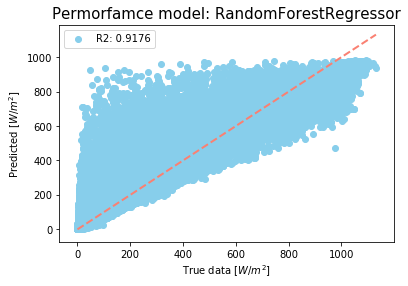

In [13]:
from sklearn.ensemble import RandomForestRegressor

# Parameters
params = {
    'n_estimators': [500, 700, 800, 1000, 1200],
}

# Estimator
rfr = RandomForestRegressor(max_depth=8,
                            max_features='sqrt',
                            random_state=10, 
                            min_samples_leaf=50,
                            n_jobs=-1,
                            min_samples_split=500)

# Grid for search
grid_rfr = GridSearchCV(rfr,
                    param_grid=params,
                    scoring='r2',
                    cv=5,
                    return_train_score=True)

# Fit for get the best estimator
grid_rfr.fit(X_train, y_train)

grid_report(grid_rfr, X_test, y_test, name='RandomForestRegressor')

### Xtreme Gradient Boosting Tree

------ XGBoostingRegressor ------ 

Best Score: 0.9274
Best parameters: {'booster': 'dart', 'n_estimators': 400}
------------------------------------------------------------
Test
R2: 0.9282


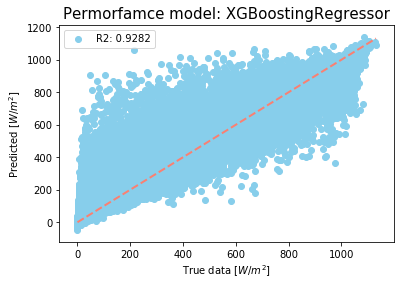

In [13]:
from xgboost import XGBRegressor

# Prameters
params = {
    'n_estimators': np.arange(60, 401, 20),
    'booster': ['gbtree', 'gblinear', 'dart']
}

# Model
xgbr = XGBRegressor(max_depth=8,
                    learning_rate=0.1,
                    n_jobs=-1,
                    subsample=0.8,
                    random_state=10) 

# Grid for search
grid_xgbr = GridSearchCV(xgbr,
                    param_grid=params,
                    scoring='r2',
                    cv=5,
                    return_train_score=True)

# Fit for get the best estimator
grid_xgbr.fit(X_train, y_train)

grid_report(grid_xgbr, X_test, y_test, name='XGBoostingRegressor')

In [14]:
from xgboost import XGBRegressor

# Prameters
params = {
    'n_estimators': [400, 600, 800, 1000, 1200],
}

# Model
xgbr = XGBRegressor(max_depth=8,
                    learning_rate=0.1,
                    n_jobs=-1,
                    subsample=0.8,
                    random_state=10,
                    booster='dart') 

# Grid for search
grid_xgbr = GridSearchCV(xgbr,
                    param_grid=params,
                    scoring='r2',
                    cv=5,
                    return_train_score=True)

# Fit for get the best estimator
grid_xgbr.fit(X_train, y_train)

grid_report(grid_xgbr, X_test, y_test, name='XGBoostingRegressor')

KeyboardInterrupt: 

### Gradient Boosting Regressor

------ GradientBoostingRegressor ------ 

Best Score : 0.9267
Best parameters: {'n_estimators': 600}
------------------------------------------------------------
Test
R2: 0.9277


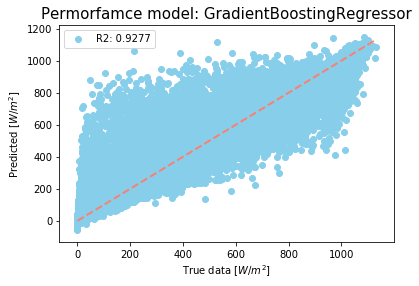

In [12]:
from sklearn.ensemble import GradientBoostingRegressor

# Prameters
params = {
    'n_estimators': [400,500,600],
}

# Model
gbr = GradientBoostingRegressor(max_depth=8,
                                 min_samples_split=500,
                                 min_samples_leaf=50,
                                 max_features='sqrt',
                                 learning_rate=0.1,
                                 subsample=0.8,
                                 random_state=10) 

# Grid for search
grid_gbr = GridSearchCV(gbr,
                    param_grid=params,
                    scoring='r2',
                    cv=5)

# Fit for get the best estimator
grid_gbr.fit(X_train, y_train)

grid_report(grid_gbr, X_test, y_test, name='GradientBoostingRegressor')

In [ ]:
# Prameters
params = {
    'n_estimators': [600,800,1000, 1200],
}

# Model
gbr = GradientBoostingRegressor(max_depth=8,
                                 min_samples_split=500,
                                 min_samples_leaf=50,
                                 max_features='sqrt',
                                 learning_rate=0.1,
                                 subsample=0.8,
                                 random_state=10) 

# Grid for search
grid_gbr = GridSearchCV(gbr,
                    param_grid=params,
                    scoring='r2',
                    cv=5)

# Fit for get the best estimator
grid_gbr.fit(X_train, y_train)

grid_report(grid_gbr, X_test, y_test, name='GradientBoostingRegressor')

## Stacking Regressor

In [ ]:
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import RidgeCV

rfr = RandomForestRegressor(max_depth=8,
                                max_features='sqrt',
                                random_state=10, 
                                min_samples_leaf=50,
                                n_jobs=-1,
                                n_estimators=500,
                                min_samples_split=500 )

xgbr = XGBRegressor(max_depth=8,
                    learning_rate=0.1,
                    n_jobs=-1,
                    subsample=0.8,
                    random_state=10,
                    n_estimators=500,
                    booster='dart') 

gbr = GradientBoostingRegressor(max_depth=8,
                                 min_samples_split=500,
                                 min_samples_leaf=50,
                                 max_features='sqrt',
                                 learning_rate=0.1,
                                 subsample=0.8,
                                 random_state=10,
                                 n_estimators=600) 

estimators = [
    ('RFR', rfr),
    ('XGBR', xgbr),
    ('GBR', gbr)
]

params = {
    'final_estimator': [DecisionTreeRegressor(),
                        RidgeCV(),
                        RandomForestRegressor(max_depth=8)]
}

# Model
stacking_reg = StackingRegressor(estimators=estimators)

# Grid for search
grid_stacking_reg = GridSearchCV(stacking_reg,
                                 param_grid=params,
                                 scoring='r2',
                                 cv=5)

# Fit for get the best estimator
grid_stacking_reg.fit(X_train, y_train)

grid_report(grid_stacking_reg, X_test, y_test, name='StackingRegressor')

In [ ]:
# Stacking by mean
estimators = [
    ('RFR', rfr),
    ('XGBR', xgbr),
    ('GBR', gbr)
]
estimators = dict(estimators)

predictions = []
for name, model in estimators.items():
    mod = model.fit(X_train, y_train)
    y_pred = mod.predict(X_test)
    predictions.append(y_pred)

y_pred = np.mean(predictions, axis=1)
r2 = r2_score(y_test, y_pred)
performance_plot(y_test, y_pred, 'StackingMean', r2)

## Final revision

In [ ]:
# All models

models = {
    'RFR': rfr,
    'GBR': grid_gbr.best_stimator_,
    'XGBR': xgbr,
    'Stack': grid_stacking_reg.best_stimator_,
}

predictions = {}
r2 = {}
for name, model in models.items():
    mod = model.fit(X_train, y_train)
    y_pred = mod.predict(X_test)
    predictions[name] = y_pred
    r2[name] = r2_score(y_test, y_pred)

In [ ]:
# RFR
plt.subplot(2,2,1)
performance_plot(y_test, predictions['RFR'], 'RFR', r2['RFR'])
# GBR
plt.subplot(2,2,2)
performance_plot(y_test, predictions['GBR'], 'GBR', r2['GBR'])
# XGBR
plt.subplot(2,2,3)
performance_plot(y_test, predictions['XGBR'], 'XGBR', r2['XGBR'])
# Stack
plt.subplot(2,2,4)
performance_plot(y_test, predictions['Stack'], 'Stack', r2['Stack'])

### XGBOOST test

In [ ]:
import xgboost as xgb

xgb_params = {
    'n_trees': 50, 
    'eta': 0.05,
    'max_depth': 5,
    'subsample': 0.7,
    'objective': 'reg:linear',
    'eval_metric': 'rmse',
    'silent': 1
}

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test)

cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=1000, early_stopping_rounds=50,
    verbose_eval=200, show_stdv=False)
cv_output[['train-rmse-mean', 'test-rmse-mean']].plot()
plt.show()

In [ ]:
model_xgb = xgb.train(dict(xgb_params, silent=0), dtrain, num_boost_round= num_boost_rounds)
from sklearn.metrics import r2_score
print("R^2 in training: %s"  % r2_score(dtrain.get_label(), model.predict(dtrain)))
print("R^2 in testing: %s"  % r2_score(y_test, model.predict(dtest)))

In [23]:
import numpy as np
r2s = {
    'nameb': 10,
    'namea': 2,
    'namez': 5,
    'namey': 3.56,
    'namex': 4.28,
}

a = list(r2s.values())
b = list(r2s.items())
listordered = []

for i in range(len(a)):
    min_ = np.argmax(a)
    listordered.append(b.pop(min_))

listordered

[('nameb', 10), ('namea', 2), ('namez', 5), ('namey', 3.56), ('namex', 4.28)]

In [20]:
max(a[1])

TypeError: '>' not supported between instances of 'int' and 'str'